## Cluster Analysis and Decision Tree Induction
#### Ryan Ondocin

# Brief Overview:
This project deals with Weather Forecating data recorded from 9am to the following day (9am) throughout 49 different locations in Australia. We will use Kmeans, Hierarchical Agglomerative Clustering and Decision Trees to predict whether or not it will rain the following day. 
  
Even with my tenuous grasp of meteorology, I believe that components such as humidity, pressure, and location will be key players in predicting our target variable, RainTomorrow. At any rate, let's dive into the data.

# Section 1: Data Preprocessing

In [1]:
import pandas as pd #importing some necessary packages for data preprocessing and visualization  
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn import preprocessing

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
df = pd.read_csv('Weather Forecast Training.csv')
df.describe()

FileNotFoundError: [Errno 2] File Weather Forecast Training.csv does not exist: 'Weather Forecast Training.csv'

In [3]:
#Consider Log Transforming attributes with large ranges/scales (Rainfall, Evaporation, WindGustSpeed, Humidity)
#df.info() #4 categorical: Location, WindGustDir, RainToday and WindGust + Target Variable (Boolean)

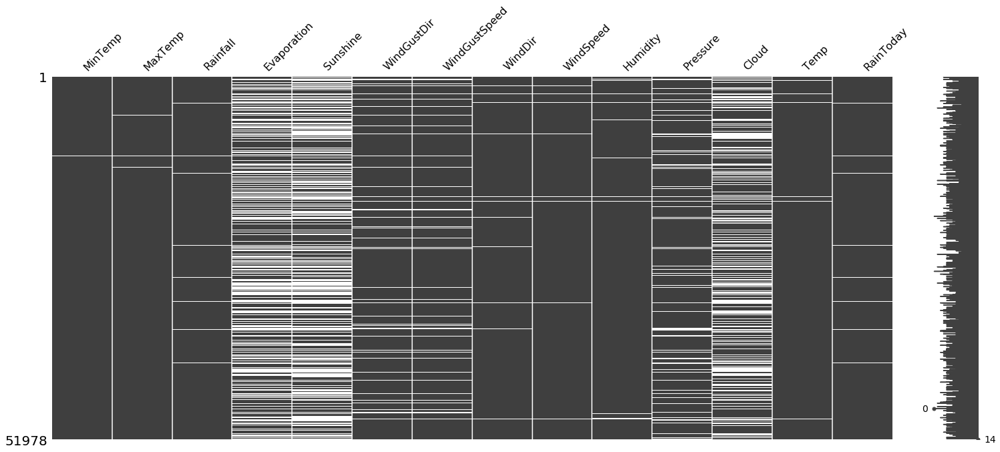

In [4]:
import missingno as msno
missingdata_df = df.columns[df.isnull().any()].tolist()
msno.matrix(df[missingdata_df]);

Text(0.5, 1.0, 'Percentage missing data')

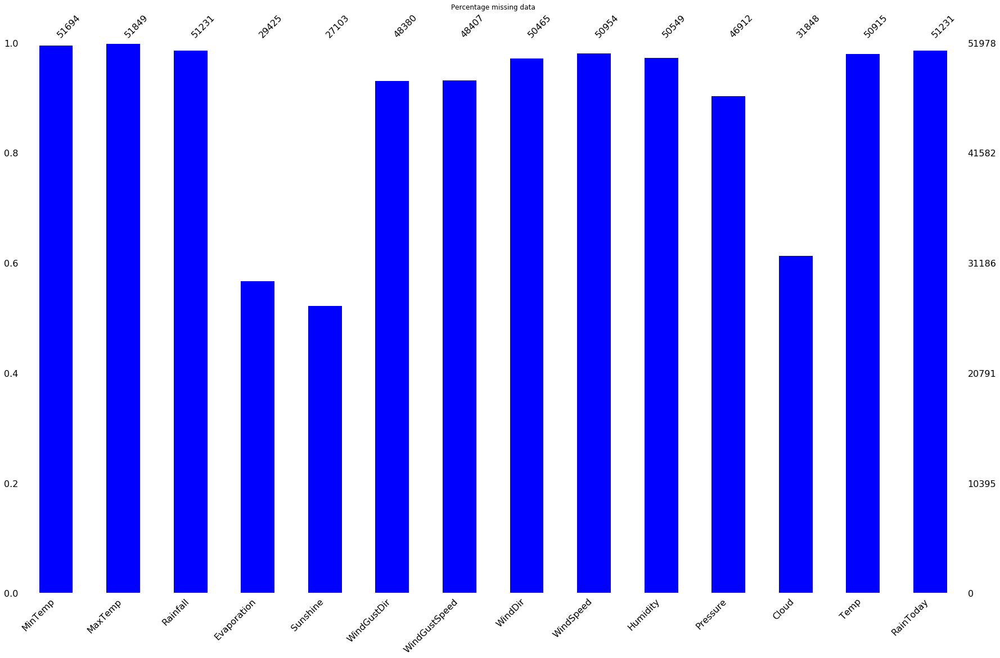

In [5]:
msno.bar(df[missingdata_df], color="blue", log=False, figsize=(30,18))
plt.title("Percentage missing data")

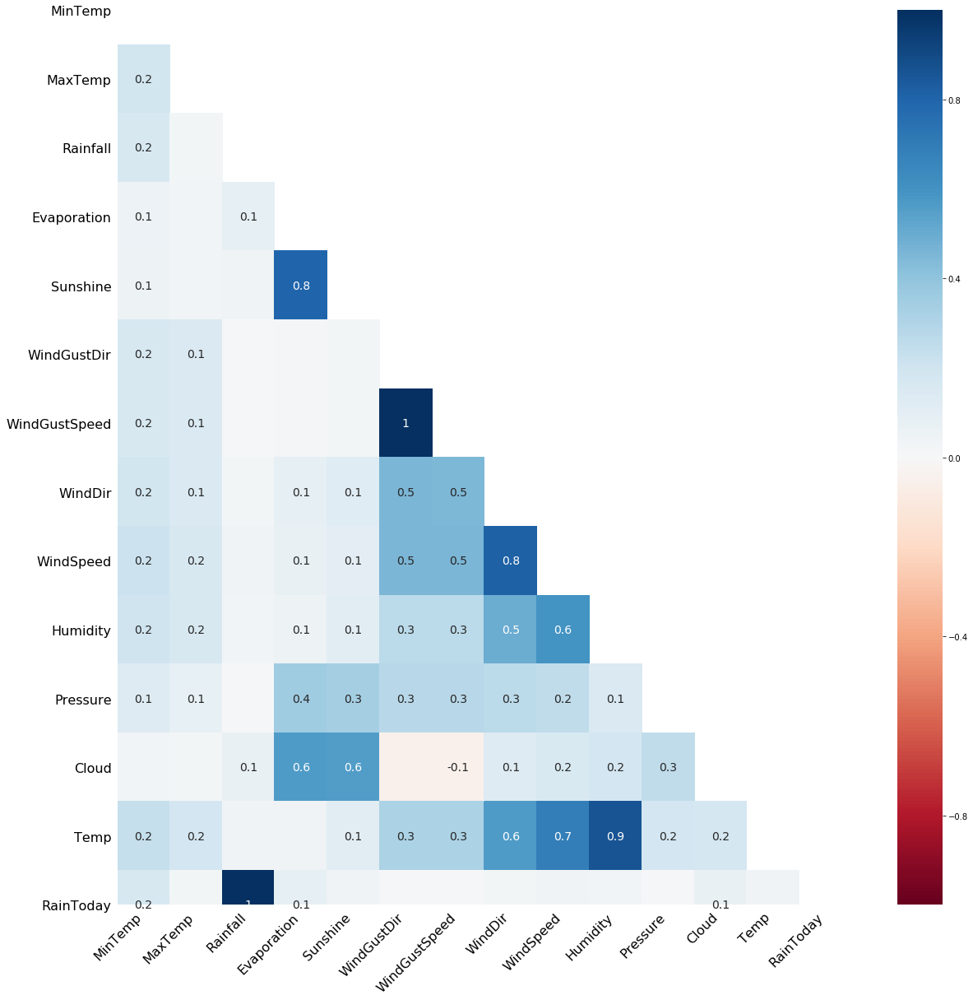

In [6]:
msno.heatmap(df[missingdata_df], figsize=(20,20))

In [7]:
df.corr()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed,Humidity,Pressure,Cloud,Temp
MinTemp,1.000000,0.741093,0.128947,0.459432,0.027024,0.125284,0.118110,0.025376,-0.385755,0.026228,0.708831
MaxTemp,0.741093,1.000000,-0.061291,0.580469,0.440606,0.012907,0.014354,-0.493495,-0.330565,-0.287222,0.979679
Rainfall,0.128947,-0.061291,1.000000,-0.062057,-0.238116,0.147924,0.061838,0.270408,-0.132772,0.177181,-0.063232
Evaporation,0.459432,0.580469,-0.062057,1.000000,0.332020,0.162055,0.107010,-0.373830,-0.238732,-0.188644,0.560314
Sunshine,0.027024,0.440606,-0.238116,0.332020,1.000000,-0.068554,0.060990,-0.665971,0.049455,-0.727811,0.466484
WindGustSpeed,0.125284,0.012907,0.147924,0.162055,-0.068554,1.000000,0.672465,0.023886,-0.413694,0.126906,-0.028852
WindSpeed,0.118110,0.014354,0.061838,0.107010,0.060990,0.672465,1.000000,-0.001789,-0.233156,0.012676,-0.004612
Humidity,0.025376,-0.493495,0.270408,-0.373830,-0.665971,0.023886,-0.001789,1.000000,-0.018034,0.569979,-0.552677
Pressure,-0.385755,-0.330565,-0.132772,-0.238732,0.049455,-0.413694,-0.233156,-0.018034,1.000000,-0.118259,-0.286400
Cloud,0.026228,-0.287222,0.177181,-0.188644,-0.727811,0.126906,0.012676,0.569979,-0.118259,1.000000,-0.334765


## Initial Data Quality Issues:
Instantly, I notice the difference in scale for most of our attributes. Having 16 dimensions that contain different units of measurement(mm Rainfall, km/hr Wind, hpa Pressure etc..) can have devastating affects on how our distance-based functions operate.  

I also notice the presence of Numerical (continuous/discrete) and categorical data. The target variable is binary which is typical of classification problems normally,(opposed to clustering) but we will need to initially figure out the nature of our missing data. 


Whether the absence of data is completely independent of observable params of interest(highly unlikely since forecasting data is almost always going to have some effect on other attributes (MCAR), Missing at Random (independent of RainTomorrow (unbiased)(unlikely) or Missing not at random (most likely here). 

Missing not a random is common of real world data and could be due to data collection inconsistencies across multiple regions or the inference from one variable to another(Rainfall and rain i.e. if mm of Rainfall was calculated we obviously know if it rained or not).

Additionally, all attributes have some correlation to rainfall so missing values can sometime allow us to infer on other values(no attributes such as the color of house; all meteorological data are included). High humidity and low pressure for example are generally required for rainfall so if a value is missing it could be because a location automatically infers the other attribute. 


Evaporation/Sunshine/Cloud also seems like a difficult thing to measure across an entire continent, perhaps due to cost of implementation/laziness.

Perhaps on extreme cases of weather (>50 mm RainFall) commonly missing attributes such as Evaporation may be taken.


Evaporation, Sunshine, Pressure, Temp have a (-) correlation to Rainfall which is intuitive given, the conditions you'd imagine rain to occur in. 

MinTemp, WindGustSpeed,WindSpeed, Humidity, Cloud all have (+) relationships to rainfall

#### Key Points Thus Far:
- The Evaporation, Sunshine and Cloud attributes have an overwhelming amount of missing values ~ 43%. 
- This could perhaps be due to an issue in the data collection process. These will need to be further investigated in the context of our data 
- I will group the observations by location to see if there are any patterns of data inconsistency
- It doesn't seem like any values were wrongly entered (plausible descriptive statistics even with noisy outliers (391 mm possible/ -4 degrees celsius) yet many values are still missing

# Finding Missing Values by Location:
- Data collection inconsistencies

In [8]:
df.groupby('Location').count().head(5)

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir,WindSpeed,Humidity,Pressure,Cloud,Temp,RainToday,RainTomorrow
Location,,,,,,,,,,,,,,,
Adelaide,1108,1107,1073,580,599,1100,1100,1101,1108,1107,1107,0,1108,1073,1108
Albany,1196,1204,1213,1104,1005,0,0,901,923,932,1213,935,935,1213,1223
Albury,1061,1063,1055,0,0,1059,1059,1045,1058,1060,1060,627,1060,1055,1063
AliceSprings,895,895,893,836,734,888,888,893,895,894,895,795,895,893,895
BadgerysCreek,1012,1015,995,0,0,1012,1012,996,1009,1004,966,0,1010,995,1017


## Potential Data Quality Issues that relate to our model (cont.)

- If a location measures an attribute(s) (WindGusDir/WindDir, MinTemp/MaxTemp, Pressure...etc.) they generally are consistent.
- There are data collection issues for certain locations. Albany and NewCastle, for example, have no measures for  WindGustDir or WindGustSpeed. 
- Evaporation and sunshine are two commonly missed metrics by locations as well.
(Albury, BadgerysCreek, Ballaret, Gold Coast, MountGinini, NewCastle, Nhil, Norah Head, Penrith, SalmonGuns, Tuggeranong, Uluru, Walpole, Witchcliffe and Wollongong).


# Imputing missing numerical values with their locational mean/median 
- This will prevent us from underfitting the data if we initially imputed missing numerical variables with the entire columns mean/median

In [9]:
imp = ['MinTemp','MaxTemp','Rainfall',
       'Evaporation','Sunshine','WindGustSpeed',
       'WindSpeed','Humidity','Pressure',
       'Cloud','Temp']
df.groupby('C')['A','B'].transform(lambda x : np.clip(x,x.quantile(0.05),x.quantile(0.95)))


for col in imp:
    if df[col].median() > df[col].mean():
        df[col] = df.groupby('Location')[col].transform(lambda x: x.fillna(x.mean()))
    else:
        df[col] = df.groupby('Location')[col].transform(lambda x: x.fillna(x.median()))        

In [10]:
df.isnull().sum() 
#didn't work for locations that didn't take measurements on Evaporation, Sunshine, 
#WindGustSpeed, Pressure or Cloud measurements

Location             0
MinTemp              0
MaxTemp              0
Rainfall             0
Evaporation      16332
Sunshine         19092
WindGustDir       3598
WindGustSpeed     2346
WindDir           1513
WindSpeed            0
Humidity             0
Pressure          4253
Cloud            12756
Temp                 0
RainToday          747
RainTomorrow         0
dtype: int64

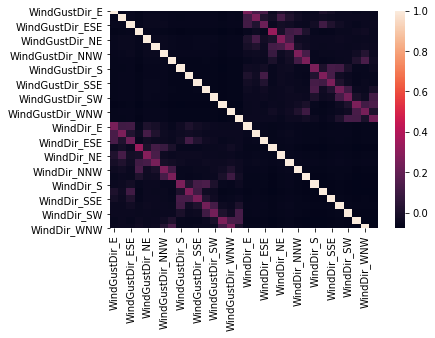

In [11]:
df_wind = pd.concat([df,pd.get_dummies(df['WindGustDir'],prefix='WindGustDir')],axis=1)
df_wind = pd.concat([df_wind,pd.get_dummies(df['WindDir'],prefix='WindDir')],axis=1)

df_wind = df_wind[['WindGustDir_E','WindGustDir_ENE', 'WindGustDir_ESE', 'WindGustDir_N', 'WindGustDir_NE',
       'WindGustDir_NNE', 'WindGustDir_NNW', 'WindGustDir_NW', 'WindGustDir_S',
       'WindGustDir_SE', 'WindGustDir_SSE', 'WindGustDir_SSW',
       'WindGustDir_SW', 'WindGustDir_W', 'WindGustDir_WNW', 'WindGustDir_WSW',
       'WindDir_E', 'WindDir_ENE', 'WindDir_ESE', 'WindDir_N', 'WindDir_NE',
       'WindDir_NNE', 'WindDir_NNW', 'WindDir_NW', 'WindDir_S', 'WindDir_SE',
       'WindDir_SSE', 'WindDir_SSW', 'WindDir_SW', 'WindDir_W', 'WindDir_WNW',
       'WindDir_WSW']]

import seaborn as sns
cor_obj = df_wind.corr()
cor_obj

sns.heatmap(cor_obj)

##### WindDir is significantly correlated with WindGustDir(obviously) so I will impute the values with their corresponding ('Wind') observation
- NOTE: This does inherently introduce bias to our model but these values are NMCAR

In [12]:
#fill WindGustDir with it's corresponding WindDir or vice versa because the two are highly correlated and differ by each observation (day-to-day) 
df.WindGustDir.fillna(df.WindDir,inplace=True)
df.WindDir.fillna(df.WindGustDir,inplace=True)
df.isnull().sum()
#some locations don't take either metric so I will impute the remaining null values with mode of entire dataset

Location             0
MinTemp              0
MaxTemp              0
Rainfall             0
Evaporation      16332
Sunshine         19092
WindGustDir       1124
WindGustSpeed     2346
WindDir           1124
WindSpeed            0
Humidity             0
Pressure          4253
Cloud            12756
Temp                 0
RainToday          747
RainTomorrow         0
dtype: int64

In [13]:
#most raintoday values have rainfall = 0. Additionally these missing values comprise only ~1.4 % 
#of the overall dataset so I will fill the 747 missing RainToday with "No"
df.RainToday.fillna(df.RainToday.mode()[0],inplace=True)

# Locational EDA  
Min/max spread on temp and delta shows us that desert locations have the largest spread, whilst coastal have less variation

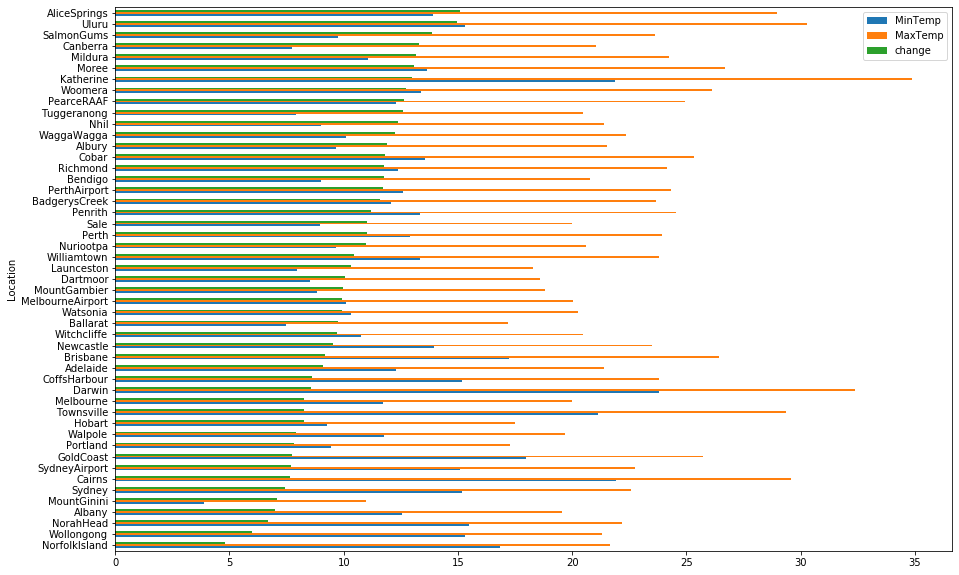

In [14]:
temp_avg = df.groupby(['Location']).mean()[['MinTemp', 'MaxTemp']]
temp_avg['change'] = temp_avg['MaxTemp'] - temp_avg['MinTemp']
temp_avg.sort_values(by='change', ascending=True).plot(kind='barh', figsize=(15,10))
plt.show()

# Exploratory Data Analysis: 
### Applying data visualization to look for interesting patterns within the data.
- Let's look at the distributions of the attributes to get a better idea of their relationships/spread

In [15]:
#for c in df.columns:
#    fig = px.histogram(df,x=c, color = "RainToday")
#    fig.show()
    #Distribution Notes:
    #Max/Min temp show fairly regular distributions and so does Temp. I will visualize this by city below to determine if 
    #how we should impute these missing values. Based on that we may drop either: Min/MaxTemp or Temp ~0% missing for all
    #Right Skewed: Evap 0-75, Sunshine right skewed but also uniform 2-14, WindGustSpeed slightly right-skewed, 2 km/hr separation between each count. May be standard practice in some locations and not others
    #Right Skewed:WindSpeed: Similar pattern to wind gust speed, cloud (0-8 okta: discrete),
    #Left Skewed: Humidity 0-100 very low kurtosis, Pressure (Super high range Log Transform)
    #Temp: Approximately Normal: 0-45
    #WindDir/WindGustDir random (probably by location)
#plotting rain distribution
rain_dist = px.histogram(df, 'Rainfall')
rain_dist.show()
#plotting evaporation distribution
evap_dist = px.histogram(df, 'Evaporation')
evap_dist.show()
#plotting pressure distribution
pressure_dist = px.histogram(df, 'Pressure')
pressure_dist.show()

# Transformations:
- Rainfall is extremely right-skewed, meaning that most days there is between ~ 0 - 20 millimeters of rain. 
- The outliers here, however, are so extreme (max 371 mm) that this data was scaled down using logarithmic (base 2) transformation.
- The same was done for evaporation and Pressure (range 970-1040). This will reduce the scale along the x-axis in a way that is much more digestable while using k-nearest neighbors to impute missing values into our model.
- It will also process outliers in our L2 function more efficiently, thus producing more coherent clusters

In [16]:
df['Log_Rainfall'] = df['Rainfall'].map(lambda x: np.log(x+2))
import plotly.express as px
log_rain = px.histogram(df,'Log_Rainfall')
log_rain.show()

df['Log_Evap'] = df['Evaporation'].map(lambda x: np.log(x+2))
#log_evap = px.histogram(df,'Log_Evap')
#log_evap.show()

df['Log_Pressure'] = df['Pressure'].map(lambda x: np.log(x+2))
log_evap = px.histogram(df,'Log_Pressure')
log_evap.show()

In [17]:
#dropping our log transformed variables
df = df.drop(['Rainfall','Pressure','Evaporation'], axis = 1)

# Dropping categorical variables:
- Location, WindDir and WindGustDir were dropped as they don't have a very high correlation to rainfall from our correlation table above. Additionally, to be processed by the kmeans algorithm they would need to be one hot encoded or put into dummy variables in order to be plotted. Following performance evaluation, (with the aformentioned categorical attributes), it was decided that only numeric variables would be useful for the remaining models. 

In [18]:
#dropping categorical variables: didn't help any of our model's Precision/Recall scores
df = df.drop(['WindDir','WindGustDir','Location'], axis = 1)
df.isnull().sum()

MinTemp              0
MaxTemp              0
Sunshine         19092
WindGustSpeed     2346
WindSpeed            0
Humidity             0
Cloud            12756
Temp                 0
RainToday            0
RainTomorrow         0
Log_Rainfall         0
Log_Evap         16332
Log_Pressure      4253
dtype: int64

# Filling remaining numerical NAs with MICE imputation:

I've used multiple imputations to account for the uncertainty association with between each imputation if I were to use KNearest Neighbors. Single imputation doesn't acount for that so MICE will help us find the most likely value overall. 

MICE essentially uses multiple regression to map the distributions of each value in order to accurately impute what is missing. I've found that this method is very flexible and much less time consuming than if I were to use KNearest Neighbors.

Although Evaporation, Pressure, Cloud and Sunshine constitute a large portion of missing values in our data set, they do show a strong correlation to rainfall. I initially tried dropping these from attributes from my model, however recall was notably increased after I decided to use this imputation measure.

In [19]:
from fancyimpute import IterativeImputer
MICE_imputer = IterativeImputer()
df_MICE = df.copy().select_dtypes(include=[np.float])
df_MICE.iloc[:,:] = MICE_imputer.fit_transform(df_MICE)
df_MICE.info()

Using TensorFlow backend.


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51978 entries, 0 to 51977
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MinTemp        51978 non-null  float64
 1   MaxTemp        51978 non-null  float64
 2   Sunshine       51978 non-null  float64
 3   WindGustSpeed  51978 non-null  float64
 4   WindSpeed      51978 non-null  float64
 5   Humidity       51978 non-null  float64
 6   Cloud          51978 non-null  float64
 7   Temp           51978 non-null  float64
 8   Log_Rainfall   51978 non-null  float64
 9   Log_Evap       51978 non-null  float64
 10  Log_Pressure   51978 non-null  float64
dtypes: float64(11)
memory usage: 4.4 MB


In [20]:
#rounding variables like cloud and sunshine to nearest integers and ensuring that our variables upper/lower limits are not exceeded.
#i.e.. can't have < 0 hours of sunshine or over 100% humidity in an observation 
df_MICE['Cloud'] = df_MICE['Cloud'].apply(lambda x: round(x))
df_MICE['Sunshine'] = df_MICE['Sunshine'].apply(lambda x: round(x))
df_MICE["Sunshine"] = df_MICE["Sunshine"].clip(lower=0)
df_MICE["Cloud"] = df_MICE["Cloud"].clip(upper=8)
df_MICE["Humidity"] = df_MICE["Humidity"].clip(upper=100)
df_MICE['RainToday'] = df['RainToday'].values
df_MICE['RainTomorrow'] = df['RainTomorrow'].values

In [21]:
df = df_MICE[['MinTemp','MaxTemp','Log_Rainfall','Log_Evap','Sunshine','WindSpeed',
                   'WindGustSpeed','Humidity','Log_Pressure','Cloud','Temp','RainToday',
                   'RainTomorrow']]
#putting our Mice imputed data back into our core training dataset

In [22]:
df.describe()

,MinTemp,MaxTemp,Log_Rainfall,Log_Evap,Sunshine,WindSpeed,WindGustSpeed,Humidity,Log_Pressure,Cloud,Temp
count,51978.000000,51978.000000,51978.000000,51978.000000,51978.000000,51978.000000,51978.000000,51978.000000,51978.000000,51978.000000,51978.000000
mean,12.551906,22.511251,1.182567,1.816846,6.310478,19.008754,41.750786,57.550590,6.923961,5.307823,20.856198
std,6.369554,7.107704,0.818336,0.413714,3.233538,9.118927,14.394127,21.597381,0.006899,2.191484,6.951676
min,-8.000000,-4.100000,0.693147,0.457763,0.000000,0.000000,7.000000,1.000000,6.886634,0.000000,-4.400000
25%,8.000000,17.200000,0.693147,1.567047,4.000000,13.000000,31.000000,43.000000,6.919486,4.000000,15.800000
50%,12.300000,21.800000,0.693147,1.791759,6.000000,19.000000,39.000000,59.000000,6.924022,6.000000,20.200000
75%,17.200000,27.500000,1.386294,2.078736,9.000000,24.000000,50.000000,73.000000,6.928494,7.000000,25.600000
max,31.400000,47.000000,5.921578,4.373238,14.000000,83.000000,135.000000,100.000000,6.946784,8.000000,46.100000


In [23]:
#Mapping RainToday and RainTomorrow to boolean values for our clustering models to process
df["RainToday"] = df["RainToday"].map({'Yes': 1, 'No': 0})
df["RainTomorrow"] = df["RainTomorrow"].map({'Yes': 1, 'No': 0})
df.head(5)

,MinTemp,MaxTemp,Log_Rainfall,Log_Evap,Sunshine,WindSpeed,WindGustSpeed,Humidity,Log_Pressure,Cloud,Temp,RainToday,RainTomorrow
0,18.9,23.7,0.693147,2.011294,7,28.0,41.0,55.0,6.935370,5,22.4,0,1
1,11.1,20.8,0.693147,1.916923,8,26.0,39.0,48.0,6.924022,7,19.5,0,0
2,15.9,19.5,2.975530,1.539342,2,9.0,44.0,99.0,6.937799,8,17.8,1,1
3,0.0,14.9,0.693147,1.648659,8,19.0,35.0,55.0,6.932448,4,14.2,0,1
4,9.1,22.7,0.693147,1.806742,7,7.0,41.0,40.0,6.936440,4,22.5,0,0


# Section 2: Build, tune and evaluate cluster analysis and decision tree models 
# K Means Algorithm: 
- K-Means is a simple and efficient clustering function that is distance based.

The objective of k-means is to minimize the intra-class variance (sum of squared distances from each data point being clustered) and to produce the most coherent clusters. 


Following clustering, we would like to measure things such as precision, recall and accuracy of our model. 
Precision corresponds to the True Positive rate over all observations that were classified as positive. 
Recall corresponds to the true positive rate over the (true positive and False Negative) cases. 

#### NOTE: The goal for every model is to maximize recall.

We would like to maximize recall in these models because it is better to predict for rain when it doesn't rather than predict no for rain when it actually does. If people we were expecting to play golf and our model predicted blue skies the following day then it would be problematic if it rained. In our model the cost of False Positives isn't as high as false negatives. This idea will be elaborated later in the model. 

- KMeans is an unsupervised learning algorithm so the model will not distinguish between what our target variables actually are. This means that if we are getting extremely low accuracy/precision/recall scores for our model we can simply flip the variable that the model is predicting on to vastly improve the performance. 


# Running our baseline kmeans model: 
- A basline kmeans model was constructed using all numeric variables in the data set. Keep in mind that RainToday/Tomorrow was mapped to contain a value of either 0 for 1 as this is required of distance based algorithms.
- Testing size was set to 30% of our original data given that it didn't tend to overfit the model (in the case where training size would be too high i.e. 95%)
- Categorical variables were justifiably removed in these models because one hot encoded variables could create densely populated regions that pull the centroid towards them (if certain locations take measurements where others do not). This would introduce unneeded complexity that obfuscates our results.

In [24]:
#X_test, y_test, X_train, y_train
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df[['MinTemp','MaxTemp','Log_Rainfall','Log_Evap','Sunshine',
                                                             'WindGustSpeed','Humidity','Log_Pressure','WindSpeed',
                                                             'Cloud','Temp','RainToday']],df["RainTomorrow"],test_size=0.3, random_state=42)

In [25]:
#Running Kmeans with default parameters
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2, n_init=25, max_iter=100, random_state=42)
kmeans.fit(X_train, y_train)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
       n_clusters=2, n_init=25, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

# KMeans Clustering Elbow curve

In [26]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist


# k means determine k
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(df)
    kmeanModel.fit(df)
    distortions.append(kmeanModel.inertia_)

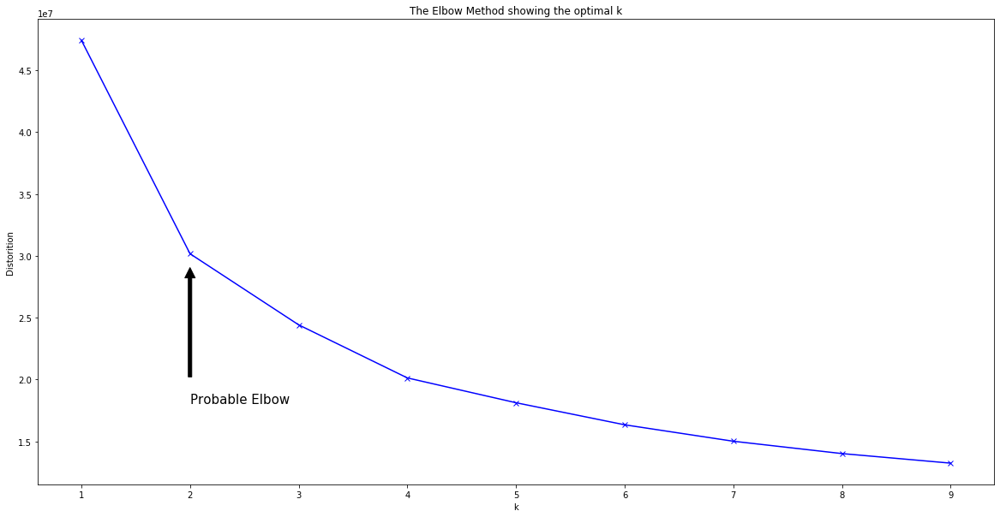

In [29]:
# Plot the elbow
plt.figure(figsize=(20,10))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distorition')
plt.annotate('Probable Elbow',
             xy=(2,distortions[1]),
             xytext=(2,distortions[4]),
             textcoords='data',
             fontsize=15,
             arrowprops=dict(facecolor='black',shrink=0.1))
plt.title('The Elbow Method showing the optimal k')
plt.show()

## This elbow curve demonstrates that the optimal number of cluster for this algorithm being = 2. 
 - This is a good sign given that this is an unsupervised algorithm and we only have two options for whether or not it rains tomorrow. 
 - This model was plotted using the distortion or average squared distances from each cluster center. This distance is measured using the euclidean distance function by default. The inflection point. Once the distortion starts decreasing in a linear fashion we would like to conclude the optimal number of clusters, k. This is a good sign that our data has been properly cleaned and that our clusters our cohesive enough around their respective centroids that they can have models run on them to test performance. 

# Utilizing GridSearchCV in order to optimize our recall score

In [31]:
from sklearn.model_selection import GridSearchCV
kmeans_grid = GridSearchCV(kmeans, param_grid = {'init': ['k-means++', 'random'],
              'precompute_distances': ['auto',True,False],
              'algorithm': ['auto','full','elkan']}, scoring='recall')
kmeans_grid.fit(X_train, y_train)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=KMeans(algorithm='auto', copy_x=True, init='k-means++',
                              max_iter=100, n_clusters=2, n_init=25,
                              n_jobs=None, precompute_distances='auto',
                              random_state=42, tol=0.0001, verbose=0),
             iid='warn', n_jobs=None,
             param_grid={'algorithm': ['auto', 'full', 'elkan'],
                         'init': ['k-means++', 'random'],
                         'precompute_distances': ['auto', True, False]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='recall', verbose=0)

# Fitting our kmeans model to the training data. The hyperparameters were chosen using GridSearchCV in order to optimize the recall of our model. 


- init = k-means ++: This ensures that bad centroids aren't randomly chosen at the beginning of the algorithm with respect to optimal clustering. 
- algorithm = 'auto', this is automatically set to elkan given that our data is densely clustered together, if our data was organized sparsely than the full algorithm would be called
- precompute_distances = 'auto' means that we simply are not precomputing distances too much RAM is required. 

In [26]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=2, n_init=25, max_iter=100, random_state=42, algorithm='full',init='k-means++',precompute_distances='auto')
kmeans.fit(X_train, y_train)

KMeans(algorithm='full', copy_x=True, init='k-means++', max_iter=100,
       n_clusters=2, n_init=25, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

# Predicting clusters on our fitted model using the X_test data set

In [27]:
y_pred = kmeans.predict(X_test)

# Obtaining a classification report 

In [28]:
from sklearn import metrics
print(metrics.classification_report(y_test, (y_pred)))

              precision    recall  f1-score   support

           0       0.76      0.66      0.71      8030
           1       0.68      0.78      0.73      7564

    accuracy                           0.72     15594
   macro avg       0.72      0.72      0.72     15594
weighted avg       0.72      0.72      0.72     15594



# Classification Report: 
- The  kmeans  has a recall of 78% and an accuracy of 72%. n was set to 2 (binary classification) and n_init is the number of times the cluster actually runs the seed. 
- Recall was optimized in this model which is good given that we want to minimize the possibility of False Negatives being thrown. This does however, compromise our precision at 68% for true cases.
- The f1 score represents the harmonic mean between precision and recall which shows the overall stability of the model. This model has done a descent job at clustering given that this data was not scaled. 
- The data was not scaled because variables that have a large range such as Pressure have high utility in how the algorithm decides to determine it's clusters. The logarithmic transformations also proved to be sufficient in accounting for the variance between each attribute.

In [80]:
import plotly.graph_objects as go

fig = go.Figure(layout = {"title": "Best Model Report for KMeans Clustering Algorithm using algorithm=full,init=k-means++"},
                data=[go.Table(header=dict(values=['Accuracy','Negatives/Positives','precision', 'recall', 'f1-score','support']),
                 cells=dict(values=[[0.72],[0,1], [0.76, 0.68], [0.66, 0.78],[0.71,0.73],[8030,7564]]))
                     ])
fig.show()

# Plotting our confusing matrix

In [30]:
results = metrics.confusion_matrix(y_test,(y_pred))
print(results)

[[5303 2727]
 [1687 5877]]


In [31]:
fig = go.Figure(layout = {"title": "Confusion Matrix for KMeans Clustering Algorithm"},
                data=[go.Table(header=dict(values=['','Predicted Positives','Predicted Negatives']),
                 cells=dict(values=[['Actual Positives','Actual Negatives'],[5303,1687],[2729,5876]]))
                    ])
fig.show()

 # Hierarchical Agglomerative Clustering on our cleaned Training dataframe

# This method of clustering aims to build groups in the form of hierarchies.  
In general, merges and splits of this model are greedily decided which can be represented in the form of a dendrogram. The Kmeans distance function is defaultly set to 'l2 or euclidean' however HAC can be manually changed to manhattan or minkowski. 

For this case, I've decided to used a euclidean based distance function and ward linkage (which minimizes the variance of the clusters being merged). This is necessary in order to give us clusters that are more coherent in form. If things like Pressure or imputed values of sunshine/cloud are returning outliers, than we want to minimize the variance between each data point since we are only dealing with two clusters. 


The standard algorithm has a time complexity of O(N)^2 which is why the model needed to be trained in google collab. 
Again, this data was not scaled given that precision and recall scores reverted to that of a coin flip which reflects that our data set was properly scaled and cleaned to begin with.

In [32]:
#importing a few necessary packages
import scipy
from scipy.cluster.hierarchy import dendrogram,linkage
from scipy.cluster.hierarchy import fcluster
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist

import matplotlib.pyplot as plt
from pylab import rcParams
import seaborn as sb


from sklearn.cluster import AgglomerativeClustering
import sklearn.metrics as sm
from sklearn.preprocessing import scale

In [33]:
#Configure the output
np.set_printoptions(precision=4,suppress=True)
%matplotlib inline
rcParams["figure.figsize"] =20,10
sb.set_style("whitegrid")

In [34]:
#isolating our target variables in a data frame and dropping it for HAC 
data = df
target = pd.DataFrame(data['RainTomorrow'])
data.drop(['RainTomorrow'],axis=1, inplace = True)

In [ ]:
k = 2 
#build the model
HClustering = AgglomerativeClustering(n_clusters= k, affinity="euclidean",linkage="ward")
#fit the model on the dataset
HClustering.fit(data)
#accuracy of the model
print("Accuracy Score: ", sm.accuracy_score(target,(HClustering.labels_)))
print("Precision Score: ",sm.precision_score(target,(HClustering.labels_)))
print("Recall Score: ",sm.recall_score(target,(HClustering.labels_)))

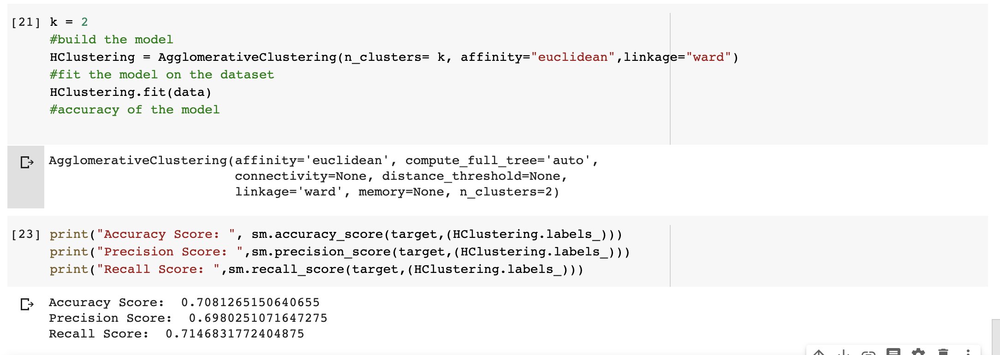

# This model performed fairly well with a recall of 71%, a precision score of 70% and an accuracy of 71%

In [ ]:
print("Accuracy Score: ", sm.accuracy_score(target,(HClustering.labels_)))
print("Precision Score: ",sm.precision_score(target,(HClustering.labels_)))
print("Recall Score: ",sm.recall_score(target,(HClustering.labels_)))

In [78]:
fig = go.Figure(layout = {"title": "Best HAC Model using 'L2'based disstance with 'ward-linkage'"},
                data=[go.Table(header=dict(values=['Accuracy','Precision','Recall']),
                 cells=dict(values=[['71%'],['70%'],['71%']]))
                    ])
fig.show()

# Dendrogram

In [ ]:
#generate dendrogram
z = linkage(data,"ward")

In [ ]:
#Plotting the dendrogram
dendrogram(z,truncate_mode= "lastp", p = 16, leaf_rotation=45,leaf_font_size=15, show_contracted=True)
plt.title("Truncated Hierachial Clustering Dendrogram")
plt.xlabel("Cluster Size")
plt.ylabel("Distance")
#divide the cluster
plt.axhline(y=450)
plt.axhline(350)
plt.axhline(200)
plt.show(125)

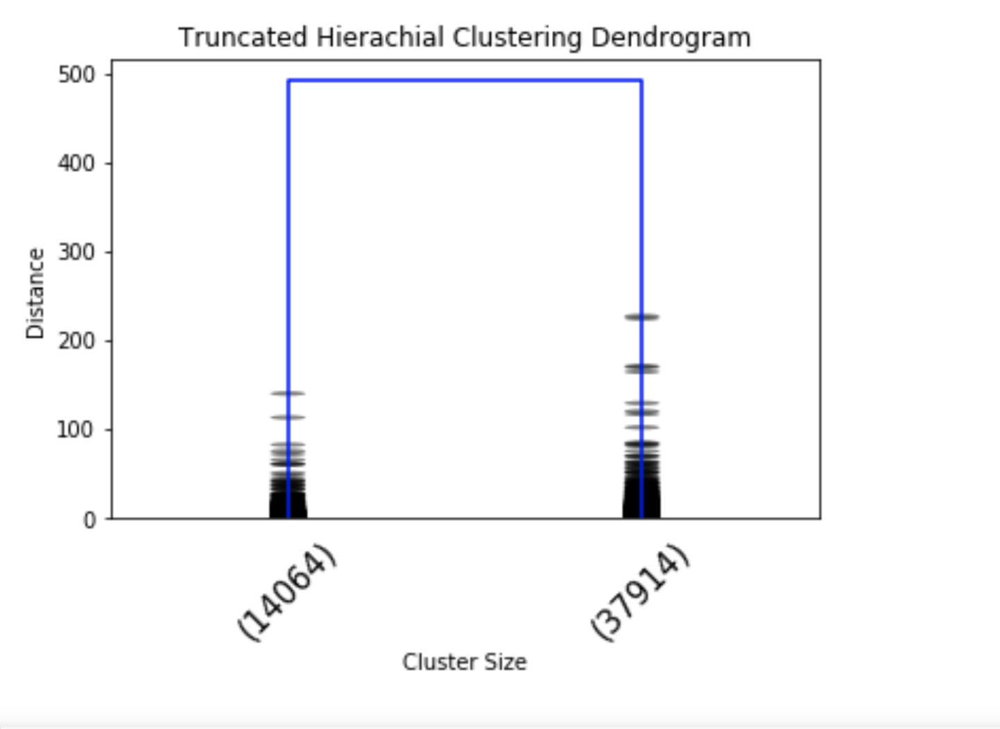

This dendrogram is showing us two natural clusters which is okay. 

# Building our Decision Tree Classifer:

In [ ]:
from sklearn.tree import DecisionTreeClassifier
d_tree = DecisionTreeClassifier()
d_tree

- Hyper parameters were chosen following GridSearchCV in order to optimize the recall score of our baseline model. 
- Gini, a measure of dataset impurity was used as the basis for making the splits in our model. Subsets of the data that are completely pure will not be split any further and will thus become leaf nodes. 
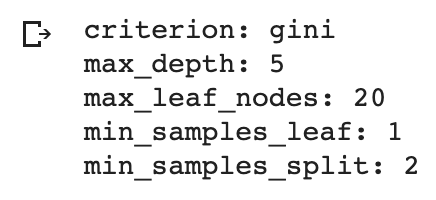

# Fitting our decision tree to the training and testing data

In [37]:
d_tree.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [38]:
y_pred = d_tree.predict(X_test)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
param_grid = {'criterion': ['gini', 'entropy'],
              'min_samples_split': [2, 10, 20],
              'max_depth': [5, 10, 20, 25, 30],
              'min_samples_leaf': [1, 5, 10],
              'max_leaf_nodes': [2, 5, 10, 20]}
grid = GridSearchCV(d_tree, param_grid, cv=6, scoring='recall')
grid.fit(X_train, y_train)

for hps, values in grid.best_params_.items():
    print(f"{hps}: {values}")


print(f"Precision:  {round(metrics.precision_score(y_pred,y_test)*100)}%")
print(f"Recall:  {round(metrics.recall_score(y_pred,y_test)*100)}%")
print(f"Accuracy: {round(metrics.accuracy_score(y_test, y_pred)*100)}%")

In [41]:
d_tree = DecisionTreeClassifier(criterion = 'gini',max_depth = 5,
max_leaf_nodes = 20,
min_samples_leaf = 1,
min_samples_split = 2)
d_tree

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=20,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [42]:
d_tree.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=20,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [43]:
y_pred = d_tree.predict(X_test)
d_tree.tree_.max_depth

5

In [44]:
from sklearn import metrics

print(f"Precision:  {round(metrics.precision_score(y_pred,y_test)*100)}%")
print(f"Recall:  {round(metrics.recall_score(y_pred,y_test)*100)}%")
print(f"Accuracy: {round(metrics.accuracy_score(y_test, y_pred)*100)}%")

Precision:  72.0%
Recall:  77.0%
Accuracy: 76.0%


In [45]:
#The baseline model has improved  from 71% to 76% accuracy following the updated grid search.

# Visualizing our Decision Tree

In [46]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(d_tree.fit(X_train,y_train), out_file='tree.dot', 
                feature_names = X_train.columns,
                class_names = ['Rain_No','Rain_Yes'],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

Optimization: The gini index (measures split quality) was able to help bring our model accuracy and recall up. 
max_depth reflects the maximum number of levels a decision tree can be split by. This limits our model. 
max_leaf nodes also helped us build a tree with n best nodes to reduce impurity. 

- Humidity was selected as the parent node given that it had the highest gini coefficient. This makes sense given that high humidity >= 65 in this case almost always leads to rain. Nodes like sunshine, and pressure make me relieved that I did not drop them after our data was cleaned. Although they contained a high amount of missing values, their proper imputation still lead to our model being more accurate overall. Categorical variables were dropped given that I did not want our tree to have two many nodes but its min_split of 2 (following gridSearchCV) is self explanatory

No Skill: ROC AUC=0.500
Decision Tree: ROC AUC=0.833


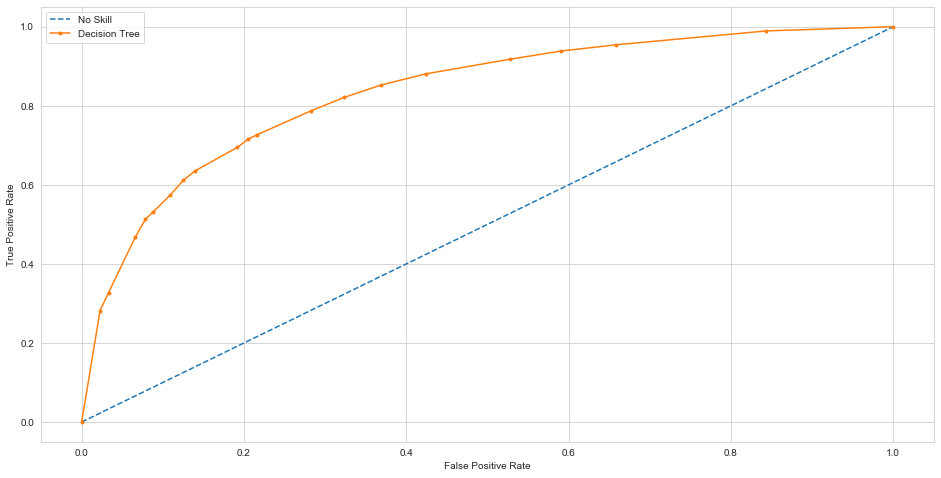

In [47]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]

# predict probabilities
lr_probs = d_tree.predict_proba(X_test)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
# calculate scores
ns_auc = roc_auc_score(y_test, ns_probs)
lr_auc = roc_auc_score(y_test, lr_probs)
# summarize scores
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('Decision Tree: ROC AUC=%.3f' % (lr_auc))
# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)
# plot the roc curve for the model
plt.figure(figsize=(16,8))
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
plt.plot(lr_fpr, lr_tpr, marker='.', label='Decision Tree')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.legend()
# show the plot
plt.show()

This model has 83% area under it's curve indicating the DT is much more accurate than if we were to simply flip a coin on the weather tomorrow. 

In [79]:
fig = go.Figure(layout = {"title": "Best Decision Tree Model using gini, min_split = 1, max_leaf = 20 and max_depth = 5'"},
                data=[go.Table(header=dict(values=['Accuracy','Precision','Recall']),
                 cells=dict(values=[['76%'],['72%'],['77%']]))
                    ])
fig.show()

# Section 3: Prediction and interpretation 

In [48]:
import pandas as pd
import numpy as np
df_test = pd.read_csv('Weather Forecast Testing.csv')
imp = ['MinTemp','MaxTemp','Rainfall',
       'Evaporation','Sunshine','WindGustSpeed',
       'WindSpeed','Humidity','Pressure',
       'Cloud','Temp']
for col in imp:
    if df_test[col].median() > df_test[col].mean():
        df_test[col] = df_test.groupby('Location')[col].transform(lambda x: x.fillna(x.mean()))
    else:
        df_test[col] = df_test.groupby('Location')[col].transform(lambda x: x.fillna(x.median()))
df_test.WindGustSpeed.fillna(df_test.WindGustSpeed.mode()[0],inplace=True)
df_test.RainToday.fillna(df_test.RainToday.mode()[0],inplace=True)
df_test['Log_Rainfall'] = df_test['Rainfall'].map(lambda x: np.log(x+2))
df_test['Log_Evap'] = df_test['Evaporation'].map(lambda x: np.log(x+2))
df_test['Log_Pressure'] = df_test['Pressure'].map(lambda x: np.log(x+2))
df_test = df_test.drop(['Rainfall','Pressure','Evaporation','WindDir','WindGustDir','Location'], axis = 1)
df_test.head()

,ID,MinTemp,MaxTemp,Sunshine,WindGustSpeed,WindSpeed,Humidity,Cloud,Temp,RainToday,Log_Rainfall,Log_Evap,Log_Pressure
0,1,15.3,21.5,1.400000,70.0,22.0,69.0,7.0,19.8,Yes,1.856298,1.481605,6.907355
1,2,7.1,11.0,5.800000,48.0,19.0,46.0,4.0,10.7,Yes,3.708682,1.163151,6.923629
2,3,3.6,16.6,9.300000,37.0,15.0,48.0,5.0,15.4,No,0.788457,1.568616,6.926184
3,4,17.6,37.4,8.340426,37.0,19.0,11.0,2.0,34.6,No,0.693147,3.583519,6.920079
4,5,11.4,25.6,2.800000,31.0,13.0,52.0,7.0,24.3,No,0.693147,2.079442,6.925988


In [49]:
from fancyimpute import IterativeImputer
MICE_imputer = IterativeImputer()
df_testMICE = df_test.copy().select_dtypes(include=[np.float])
df_testMICE.iloc[:,:] = MICE_imputer.fit_transform(df_testMICE)

In [50]:
df_testMICE['Cloud'] = df_testMICE['Cloud'].apply(lambda x: round(x))
df_testMICE['Sunshine'] = df_testMICE['Sunshine'].apply(lambda x: round(x))
df_testMICE["Sunshine"] = df_testMICE["Sunshine"].clip(lower=0)

In [51]:
df_testMICE["Cloud"] = df_testMICE["Cloud"].clip(upper=8)
df_testMICE["Humidity"] = df_testMICE["Humidity"].clip(upper=100)
df_testMICE['RainToday'] = df_test['RainToday'].values

In [52]:
df_test = df_testMICE[['MinTemp','MaxTemp','Log_Rainfall','Log_Evap','Sunshine','WindSpeed',
                   'WindGustSpeed','Humidity','Log_Pressure','Cloud','Temp','RainToday']]

In [53]:
df_test["RainToday"] = df_test["RainToday"].map({'Yes': 1, 'No': 0})

In [54]:
df_test.head()

,MinTemp,MaxTemp,Log_Rainfall,Log_Evap,Sunshine,WindSpeed,WindGustSpeed,Humidity,Log_Pressure,Cloud,Temp,RainToday
0,15.3,21.5,1.856298,1.481605,1,22.0,70.0,69.0,6.907355,7,19.8,1
1,7.1,11.0,3.708682,1.163151,6,19.0,48.0,46.0,6.923629,4,10.7,1
2,3.6,16.6,0.788457,1.568616,9,15.0,37.0,48.0,6.926184,5,15.4,0
3,17.6,37.4,0.693147,3.583519,8,19.0,37.0,11.0,6.920079,2,34.6,0
4,11.4,25.6,0.693147,2.079442,3,13.0,31.0,52.0,6.925988,7,24.3,0


In [59]:
df_test.to_csv('df_test_final.csv')

In [1]:
df_output = pd.read_csv('Weather Forecast Testing.csv')

NameError: name 'pd' is not defined

In [61]:
import pandas as pd
k = 2 
HClustering = AgglomerativeClustering(n_clusters=k , affinity="euclidean",linkage="ward")
#fit the model on the dataset
HAC_test = HClustering.fit(df_test)

In [67]:
y_dt_pred = d_tree.predict(df_test)
y_kmeans_pred_test = (kmeans.predict(df_test))
y_HAC = HClustering.labels_

In [71]:
Final = pd.DataFrame(list(zip(df_output['ID'], y_kmeans_pred_test,y_HAC, y_dt_pred,)),columns=['ID','KMeans','HAC','DT'])

In [72]:
Final.head(50)

,ID,KMeans,HAC,DT
0,1,1,1,1
1,2,0,0,0
2,3,0,0,0
3,4,0,0,0
4,5,0,0,0
5,6,0,1,0
6,7,0,0,0
7,8,1,1,0
8,9,0,0,0
9,10,0,0,0


In [74]:
Final.to_csv('Predictions_Ondocin.csv', index=False)